In [1]:
using Distributions, Plots, Optim, Interpolations, SymPy, Random, Plots.PlotMeasures, ForwardDiff, BenchmarkTools

# 1 Bellman Equation with Shocks

In [2]:
U(c, σ) = (c ^(1 - σ)) / (1 - σ) 
f(k, α) = k^α

f (generic function with 1 method)

#### Constants

In [26]:
α = 1/3
σ = 0.8
β = 0.93
N = 100
tol = 10^-15
ω = 0.01
θ = [α, σ, β, N]
ζ_dist = LogNormal(0, ω);

## 1.1 Bellman Solver with VFI

$$
\begin{gathered}
V(y)=\max _{c}\left\{U(c)+\beta E\left[V\left(\xi(y-c)^{\alpha}\right)\right]\right\} \\
U(c)=\frac{c^{1-\sigma}}{1-\sigma} \\
\log \xi^{\sim} N(0, \omega)
\end{gathered}
$$



Euler equation:

$$
U'(c_t)=\beta (Af'(K_{t+1})) U'(c_{t+1})
$$

Steady state:
$$
c_t=c_{t+1}=c^\star
$$
$$
K_t=K_{t+1}=K^\star
$$
$$ 
\Rightarrow 1=\beta (Af'(K^\star)) \rightarrow K^\star=(\frac {1}{\beta A \alpha})^{\frac {1}{\alpha -1}},\ A\ =\ Average\ of\ Shocks
$$ 
$$
\Rightarrow y^\star =A {K^\star}^{\alpha}=A(\frac {1}{\beta A \alpha})^{\frac {\alpha}{\alpha -1}}=A^{\frac{1}{1-\alpha}}({\beta  \alpha})^{\frac {\alpha}{1- \alpha }}
$$

In [27]:
function Bellman_Solver(θ, U, f, ζ_dist, tol)
    α, σ, β, N = θ
    N = Int64(N)
    Random.seed!(1395)
    ζ = rand(ζ_dist, 1000)
    A = mean(ζ)
    y_star = A^(1/(1-α)) * (β* α)^(α/(1-α))
    
    y_grid = collect(range(0.0, y_star*1.2, length = N))

    V = [y_grid]
    dist = 1
    C_prime = zeros(N)
    V1 = zeros(N)

    while dist > tol
        V⁰ = LinearInterpolation(y_grid, V[end], extrapolation_bc = Linear())
        for i ∈ 1:N
            T(c) = -(U(c, σ) + β * mean(V⁰(ζ .* f(y_grid[i] - c, α))))
            @inbounds C_prime[i] = optimize(T, 0.0, y_grid[i]).minimizer
            @inbounds V1[i] = -T(C_prime[i])
        end

        dist = maximum(abs.(V1 .- V[end]))
        append!(V, [V1])
        V1 = zeros(N)
    end
    
    return V, LinearInterpolation(y_grid, C_prime), y_grid, y_star

end

Bellman_Solver (generic function with 2 methods)

In [28]:
V, C, y_grid, yₛₛ = Bellman_Solver(θ, U, f, LogNormal(0, 0.5), tol);

LoadError: InterruptException:

In [13]:
size(V)

(339,)

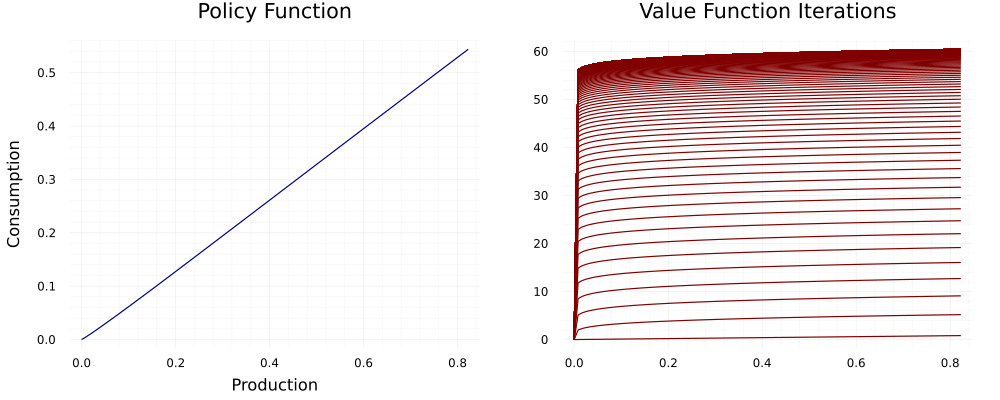

In [25]:
c(x) = C(x)
theme(:vibrant)
p1 = plot(c, y_grid, legend = false, title = "Policy Function", color = "navy", ylabel = "Consumption", xlabel = "Production")
p2 = plot(y_grid, V[1:end-1], color = "maroon", label = false, title = "Value Function Iterations")
plot(p1, p2, layout = (1, 2), size = (1000, 400), dpi = 1000, margin = 5mm)

## 1.2 Bellman Solver with PFI

Bellman Equation with IID shock:
$$
V(x)=\max _{\{u\}}\{r(x, u)+\beta E[V(g(x, u, \xi)) \mid x]\}
$$
FOC:
$$
\frac{\partial r}{\partial u}(x, u)+\beta E\left[\frac{\partial g}{\partial u}(x, u, \xi) V^{\prime}(g(x, u, \xi)) \mid x\right]=0
$$
EC:
$$
V^{\prime}(x)=\frac{\partial r}{\partial x}(x, h(x))+\beta E\left[\frac{\partial g}{\partial x}(x, h(x), \xi) V^{\prime}(g(x, u, \xi)) \mid x\right]
$$

In [14]:
U(c, σ) = (c ^(1 - σ)) / (1 - σ) 
f(k, α) = k^α
U¹(c, σ) = c ^ (-σ)
f¹_c(k, α) = k > 0. ? -α * k^(α-1) : 0.
f¹_y(k, α) = k > 0. ? α * k^(α-1) : 0.

f¹_y (generic function with 1 method)

In [20]:
function Bellman_Solver(θ, U, f, U¹, f¹_c, f¹_y, ζ_dist, tol)
    α, σ, β, N = θ
    N = Int64(N)
    Random.seed!(1395)
    ζ = rand(ζ_dist, 1000)
    A = mean(ζ)
    y_star =  A^(1/(1-α)) * (β* α)^(α/(1-α))
    
    y_grid = collect(range(0., y_star*1.2, length = N))

    PF = [y_grid]
    dist = 1
    C_prime = zeros(N)
    V_prime = zeros(N)
    VP = [y_grid]

    while dist > tol
        for i ∈ 1:N
            V_p = LinearInterpolation(y_grid, VP[1], extrapolation_bc=Line())
            k = y_grid[i] - PF[end][i]
            V_prime[i] =  β * mean(ζ .* f¹_y(k, α) .* V_p(f(k, α) .* ζ))
        end
        append!(VP, [V_prime])
        for i ∈ 1:N
            V_p = LinearInterpolation(y_grid, VP[end], extrapolation_bc=Line())
            EC(x) = (U¹(x[1], σ) + β * mean(ζ .* f¹_c(y_grid[i] - x[1], α) .* V_p(f(y_grid[i] - x[1], α) .* ζ)))^2
            C_prime[i] = optimize(EC, 0., y_grid[i]).minimizer
        end
        
        dist = maximum(abs.(C_prime .- PF[end]))
        append!(PF, [C_prime])
        V_prime = zeros(N)
        C_prime = zeros(N)
    end

    return PF, LinearInterpolation(y_grid, PF[end]), y_grid, y_star
end

Bellman_Solver (generic function with 2 methods)

In [ ]:
function PFI(r,g,shock_distribution,y_star,N,β,ϵ)
    Random.seed!(1394)
    ζ=rand(shock_distribution,N)
    A=mean(ζ)
    Initial(y)=y
    ygrid = range(0.0, y_star*2, N)
    ru(x,u)= x>=u ? Zygote.gradient(r,x,u)[2] : 0
    rx(x,u)= x>=u ? Zygote.gradient(r,x,u)[1] : 0
    gu(x,u,ζ)= x>=u ? Zygote.gradient(g,x,u,ζ)[2] : 0
    gx(x,u,ζ)= x>=u ? Zygote.gradient(g,x,u,ζ)[1] : 0
    h=zeros(N)
    V′ⱼ=Initial.(ygrid)
    dist = 1
    c_g=zeros(N)
    V′ⱼ₊₁=zeros(N)
    while ~(isapprox(dist, 0.0; atol=ϵ, rtol=0))
            V_intp = LinearInterpolation(ygrid, V′ⱼ,extrapolation_bc=Line())
            for i ∈ 2:N
                c=h[:,end][i]
                y=ygrid[i]
                if typeof(rx(y,c))!= Nothing
                    V′ⱼ₊₁[i]=rx(y,c) + β* mean(gx.(y,c,ζ) .* V_intp.(g.(y,c,ζ))) #EC
                else
                    V′ⱼ₊₁[i]= β* mean(gx.(y,c,ζ) .* V_intp.(g.(y,c,ζ)))
                end
            end
            V_intp_next = LinearInterpolation(ygrid, V′ⱼ₊₁,extrapolation_bc=Line())
            for i ∈ 2:N
                y=ygrid[i]
                G(c)=(ru(y,c) + β * mean( gu.(y,c,ζ) .* V_intp_next.( g.(y,c,ζ) )) )^2
                c_g[i] = optimize(G, 0.0, y).minimizer #FOC
            end
            dist = maximum(abs.(c_g .- h[:,end]))
            h=hcat(h,c_g)
            V′ⱼ=V′ⱼ₊₁
            c_g = zeros(N)
    end
    return h, LinearInterpolation(ygrid, h[:,end],extrapolation_bc=Line()), ygrid
end

In [21]:
PF, C, y_grid, yss = Bellman_Solver(θ, U, f, U¹, f¹_c, f¹_y, ζ_dist, 10^-15);

In [22]:
size(PF)

(39,)

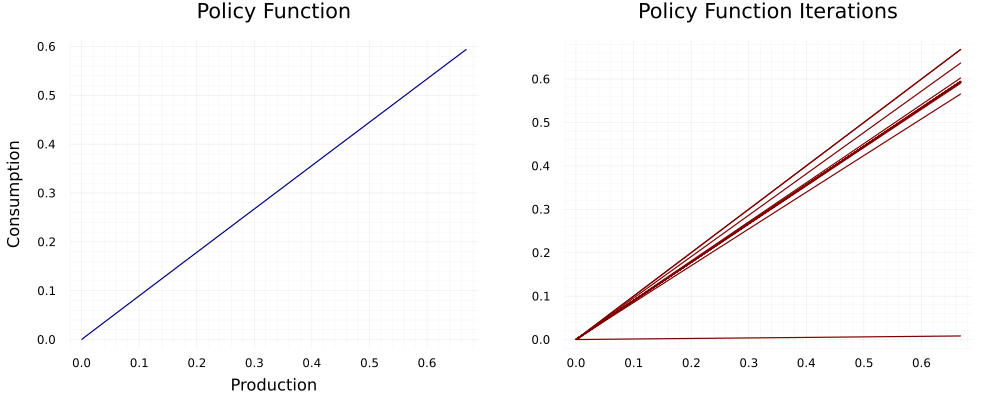

In [23]:
c(x) = C(x)
theme(:vibrant)
p1 = plot(c, y_grid, legend = false, title = "Policy Function", color = "navy", xlabel = "Production", ylabel = "Consumption")
p2 = plot(y_grid, PF, color = "maroon", legend = false, title = "Policy Function Iterations")
plot(p1, p2, layout = (1, 2), size = (1000, 400), dpi = 1000, margin = 5mm)

## 1.3 General Bellman Solver

In [13]:
@syms y, u
r = (u ^(1 - σ)) / (1 - σ)
h = (y - u)^α;

In [14]:
struct Solver
    r
    h
    method
    tol
end
struct Shock_Solver
    Solver
    ζ_dist
end

In [15]:
function Bellman_Solver(θ, solver::Shock_Solver)
    α, σ, β, N = θ
    N = Int64(N)
    Random.seed!(1395)
    ζ = rand(solver.ζ_dist, N)
    A = mean(ζ)
    y_star = A^(1/(1-α)) * (β* α)^(α/(1-α))
    
    y_grid = collect(range(0.0, y_star*1.1, length = N))
    k_grid = collect(range(0.0, k_star*1.1, length = N))
    println(121)
    if solver.Solver.method == "VFI"
        println(111)
        V = [y_grid]
        dist = 1
        u_prime = zeros(N)
        V1 = zeros(N)

        while dist > tol
            V⁰ = LinearInterpolation(y_grid, V[end], extrapolation_bc = Linear())
            for i ∈ 1:N
                T(x) = -(r(x, y) + β * mean(V⁰(ζ .* h(x, y_grid[i]))))
                u_prime[i] = optimize(T, 0.0, y_grid[i]).minimizer
                V1[i] = -T(u_prime[i])
            end

            dist = maximum(abs.(V1 .- V[end]))
            append!(V, [V1])
            V1 = zeros(N)
        end
        
        return V, LinearInterpolation(y_grid, u_prime) , y_grid, y_star

    elseif solver.Solver.method == "PFI"
        PF = [y_grid]
        dist = 1
        u_prime = zeros(N)
        V_prime = zeros(N)
        VP = [V_prime]

        d(f, x) = ForwardDiff.derivative(f, x)

        while dist > solver.Solver.tol
            for i ∈ 1:N
                h_prime = diff(h, y)(PF[end][i], y_grid[i]) .* ζ
                V_p = LinearInterpolation(y_grid, VP[end], extrapolation_bc=Line())
                V_prime[i] = diff(r, y)(PF[end][i], y_grid[i]) * d(V_p, y_grid[i]) + β * mean(h_prime .* (1 - d(V_p, y_grid[i])) .* V_p(h(PF[end][i], y_grid[i]) .* ζ))
            end
            append!(VP, [V_prime])
            for i ∈ 1:N
                V_p = LinearInterpolation(y_grid, VP[end], extrapolation_bc=Line())
                EC(x) = (U¹(x[1], σ) + β * mean(ζ .* f¹_c(y_grid[i] - x[1], α) .* V_p(f(y_grid[i] - x[1], α) .* ζ)))^2
                C_prime[i] = optimize(EC, 0., y_grid[i]).minimizer
            end
            for i ∈ 1:N
                V_p = LinearInterpolation(y_grid, VP[end], extrapolation_bc=Line())
                h_prime = diff(h, u)(u, y_grid[i]) .* ζ
                EC(x) = (diff(r, u)(x, y_grid[i]) *  + β * mean(h_prime .* V_p(h(x, y_grid[i]) .* ζ))) ^ 2
                u_prime[i] = optimize(EC, 0.0, y_grid[i]).minimizer
            end
            
            dist = maximum(abs.(u_prime .- PF[end]))
            append!(PF, [u_prime])
            V_prime = zeros(N)
            u_prime = zeros(N)
        end

        return PF, LinearInterpolation(y_grid, PF[end]), y_grid, y_star
    end
    
end

Bellman_Solver (generic function with 3 methods)

# 2 Transitional Dynamics

## 2.1 VFI

$$
\begin{aligned}
V(y) &=\max _{c}\left\{\left(\frac{c^{1-\sigma}}{1-\sigma}\right)+\beta V\left(k^{\prime}\right)\right\} \\
c+k^{\prime} &=A k^{\alpha}+(1-\delta) k
\end{aligned}
$$

In [16]:
function Continuous_Bellman_Solver(θ, F, tol; Initial_guess = missing)
    A, α, δ, σ, β, p, N = θ
    N = Int64(N)

    Γ(k) = min(A * k^α / p  + (1-δ) * k, K_star)

    #𝑖
    ρ = 1 / β - 1
    K_star = ((A * α) / (p * (ρ + δ))) ^ (1 / (1 - α))

    #𝑖𝑖
    K_grid = collect(range(0.0, K_star, length = N))

    #𝑖𝑖𝑖
    V = [K_grid] #Initial Guess
    if !ismissing(Initial_guess)
        V = [Initial_guess]
    end
    dist = 1
    K_prime = zeros(N)
    V1 = zeros(N)
    
    #𝑖𝑣
    while dist > tol
        V⁰ = LinearInterpolation(K_grid, V[end])
        for i ∈ 1:N
            Ω(k′) = -(F(K_grid[i], k′) + β * V⁰(k′))
            K_prime[i] = optimize(Ω, 0.0, Γ(K_grid[i])).minimizer
            V1[i] = -Ω(K_prime[i])
        end

        dist = maximum(abs.(V1 .- V[end]))
        append!(V, [V1])
        V1 = zeros(N)
    end
    
    I = [K_prime[i] - (1 - δ) * K_grid[i] for i ∈ 1:N]
    C = [A * K_grid[i]^α - (K_prime[i] - (1 - δ) * K_grid[i]) for i ∈ 1:N]

    return V, LinearInterpolation(K_grid, K_prime), K_grid, LinearInterpolation(K_grid, C), LinearInterpolation(K_grid, I), K_star
end

Continuous_Bellman_Solver (generic function with 1 method)

In [17]:
A = 1
α = 0.66
δ = 0.1
σ = 0.1
β = 0.95
p = 0.95
N = 1000
tol = 10^-7
θ = [A, α, δ, σ, β, p, N]
f(x) = (A * x^α) + (p * (1 - δ) * x)
F(x, y) = (f(x) - (p * y)) > 0 ? ((f(x) - (p * y))^(1-σ)) / (1-σ) : 0
V, K′, K, C, I, Kss = Continuous_Bellman_Solver(θ, F, tol);

In [19]:
kk(x) = K′(x)
theme(:vibrant)
p1 = plot(kk, K, legend = false, title = "Policy Function")
p1 = plot!(K, K)
p2 = plot(K, V, color = "steelblue", legend = false, title = "Value Function Iterations")
plot(p1, p2, layout = (2, 1), size = (600, 800), dpi = 1000, margin = 5mm)

## 2.2 Half-Life Time

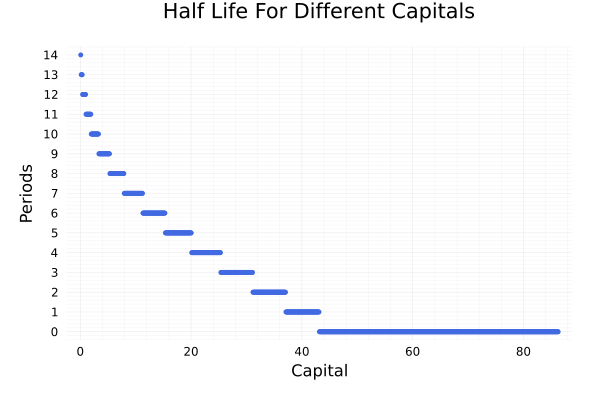

In [22]:
half_life(k) = k >= Kss/2 ? 0 : 1 + half_life(K′(k))
scatter(half_life, K[2:end], legend = false, title = "Half Life For Different Capitals", xlabel = "Capital", ylabel = "Periods", color = :royalblue, markersize = 3, yticks = 0:1:15, dpi = 1000, margin = 5mm)

## 2.3 99% of Steady State

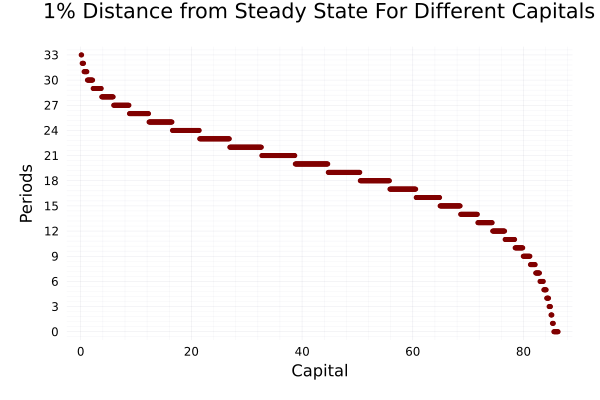

In [23]:
one_percent_ss(k) = k >= 0.99*Kss ? 0 : 1 + one_percent_ss(K′(k))
scatter(one_percent_ss, K[2:end], legend = false, title = "1% Distance from Steady State For Different Capitals", xlabel = "Capital", ylabel = "Periods", color = :maroon, markersize = 3, yticks = 0:3:36, dpi = 1000, margin = 5mm)

# 3 Log-Linearization Method

# 3.1

$$
y-c = k^{\prime} - (1-\delta)k = k^{\prime} \rightarrow \delta = 1
$$
$$
V(k)=\max_{k'}\left\{\frac{(\xi k^{\alpha} - k')^{1-\delta}}{1- \delta}+\beta E[ V\left(k^{\prime} \right)]\right\}
$$
$$
[k^{\prime}] : \left(\xi k^{\alpha} - k^{\prime} \right)^{-\sigma} = \beta E[ V^{\prime} \left(k^{\prime} \right)]
$$
$$
[k] : V'(k) = \alpha \xi k^{\alpha - 1} \left(\xi k^{\alpha} - k^{\prime} \right)^{-\sigma}
$$
$$
\rightarrow in \ steady \ state:
$$
$$
k=k^{\prime} \Rightarrow \left(\xi k^{\alpha} - k \right)^{-\sigma} = \beta E \left[\alpha \xi k^{\alpha - 1}(\xi k^{\alpha} - k^{\prime})^{-\sigma} \right]
$$
$$
\log{\xi} : N(0, \ w) \rightarrow E(\xi) = 1
$$
$$
k_{ss} = \left(\beta \alpha \right)^{\frac{1}{1-\alpha}}
$$

Probable log-linearization (differentiation method): 
$$
-\sigma(\xi k^{\alpha} - k)^{-\sigma -1}(\xi \alpha k^{\alpha - 1} dk - dk) = \\
\beta \alpha (\alpha -1) k^{\alpha - 2} dk (k^{\alpha} - k)^{-\sigma} - \sigma \beta \alpha k^{\alpha - 1}(k^{\alpha}-k)^{-\sigma -1}(\alpha k^{\alpha - 1} dk - dk)
$$

# 3.3

$$
[k] : V' = \frac{\left(1-\sigma \right) \left(\alpha k^{\alpha - 1} S + \left(1-\delta \right) \right) (Sk^{\alpha} + (1-\delta)k - k')^{-\sigma}}{1-\sigma}
$$
$$
[k'] : \frac{\left(1-\sigma \right) (+1) (Sk^{\alpha} + (1-\delta)k - k')^{-\sigma}}{1-\sigma} = \beta E(V')
$$

$$
(Sk^{\alpha} + (1-\delta)k - k')^{-\sigma} = \beta E \left( (\alpha k^{\alpha - 1} S + (1-\delta)) (Sk^{\alpha} + (1-\delta)k - k')^{-\sigma} \right)
$$
Steady State:
$$
(k^{\alpha} -\delta k)^{-\sigma} =  \beta \left( (\alpha k^{\alpha - 1} + (1-\delta)) (k^{\alpha} -\delta k)^{-\sigma} \right) \\
\rightarrow \bar{k} = \left( \left( \frac{1}{\beta} - \left(1-\delta \right) \right) \frac{1}{\alpha}\right)^{\frac{1}{1-\alpha}} \\
\rightarrow \bar{k} = \left( \frac{\alpha}{\rho + \delta} \right)^{\frac{1}{1-\alpha}}
$$

$$
diff: (-\sigma)(k^{\alpha} -\delta k)^{-\sigma} (k^{\alpha} ds - \delta dk) = \\
\beta \left[ \left( \alpha (\alpha -1) k^{\alpha -2}dk \right) (k^{\alpha} - \delta k)^{-\sigma} - \sigma (k^{\alpha} - \delta k)^{-\sigma -1}(\alpha k^{\alpha -1} dk - \delta dk) \right]
$$

$$
(-\sigma) \left(k^{\alpha} \hat{s} - \delta k \hat{k} \right) = 
\left[ \frac{\alpha (\alpha - 1) k^{\alpha -1}}{\alpha k^{\alpha -1} + 1 - \delta} \hat{k} - \left( \frac{\sigma}{k^{\alpha} - \delta k} \right) 
\left( \frac{\alpha k^{\alpha} \hat{k} - \delta k \hat{k}}{\alpha k^{\alpha - 1} + 1 - \delta } \right) \right]
$$

$$
\hat{S}_t = \left( \frac{\alpha (1-\alpha)}{\sigma \left( \alpha k^{2\alpha -1} + (1-\delta)k^{\alpha} \right)} + \frac{1}{k^{\alpha} - \delta k}. \frac{\alpha k^{\alpha} - \delta k}{\alpha k^{2\alpha -1} + (1-\delta)k^{\alpha}} + \delta k^{1-\alpha} \right) \hat{K}_t \\
k = \bar{k} = \left( \frac{\alpha}{\rho + \delta} \right)^{\frac{1}{1-\alpha}}
$$

$$
\hat{S}_t = \left[ \frac{\alpha (1-\alpha)}{\sigma} + \frac{\alpha \bar{k}^{\alpha} - \delta \bar{k}}{\bar{k}^{\alpha} - \delta \bar{k}} + \delta \left( \alpha \bar{k}^{\alpha} + (1-\delta)\bar{k} \right) \right] \hat{K}_t \\
\bar{k} = \left( \frac{\alpha}{\rho + \delta} \right)^{\frac{1}{1-\alpha}}
$$

# 4 Discrete Dynamic Programming

## 4.1 Consumption Saving Problem with Discrete Dynamic Programming

In [60]:
r = 0.1
σ = 0.8
ω = 1
β = 0.93
s = [0, 1]
N = 1000
tol = 10^-2
θ = [r, σ, ω, β, s, N];

In [61]:
U(a, a′, s) = (1 + r)*a + ω*s - a′ > 0. ? ((1 + r)*a + ω*s - a′)^(1 - σ) / (1 - σ) : 0.

U (generic function with 2 methods)

In [62]:
function Continuous_Bellman_Solver(θ, U, tol; IG₁ = missing, IG₂ = missing)
    r, σ, ω, β, s, N = θ
    N = Int64(N)
    a_max = 5.
    a_min = 0.
    a_grid = collect(range(a_min, a_max, length = N))


    Γ(a, s) = min((1 + r)*a + ω*s, a_max)

    V₁ = [a_grid]
    V₂ = [a_grid] 
    if !ismissing(IG₁)
        V₁ = [IG₁]
    end
    if !ismissing(IG₂)
        V₂ = [IG₂]
    end
    dist = 1
    a₁_prime = zeros(N)
    a₂_prime = zeros(N)
    V1 = zeros(N)
    V2 = zeros(N)
    
    #𝑖𝑣
    while dist > tol
        V⁰¹ = LinearInterpolation(a_grid, V₁[end])
        V⁰² = LinearInterpolation(a_grid, V₂[end])
        for i ∈ 1:N
            Ω₁(a′) = -(U(a_grid[i], a′, s[1]) + β * V⁰¹(a′))
            Ω₂(a′) = -(U(a_grid[i], a′, s[2]) + β * V⁰²(a′))
            a₁_prime[i] = optimize(Ω₁, 0.0, Γ(a_grid[i], s[1])).minimizer
            a₂_prime[i] = optimize(Ω₂, 0.0, Γ(a_grid[i], s[2])).minimizer
            V1[i] = -Ω₁(a₁_prime[i])
            V2[i] = -Ω₂(a₂_prime[i])
        end
        dist = maximum([maximum(abs.(V1 .- V₁[end])), maximum(abs.(V2 .- V₂[end]))])
        append!(V₁, [V1])
        append!(V₂, [V2])
        V1 = zeros(N)
        V2 = zeros(N)
    end
    
    return V₁, V₂, LinearInterpolation(a_grid, a₁_prime), LinearInterpolation(a_grid, a₂_prime), a_grid
end

Continuous_Bellman_Solver (generic function with 1 method)

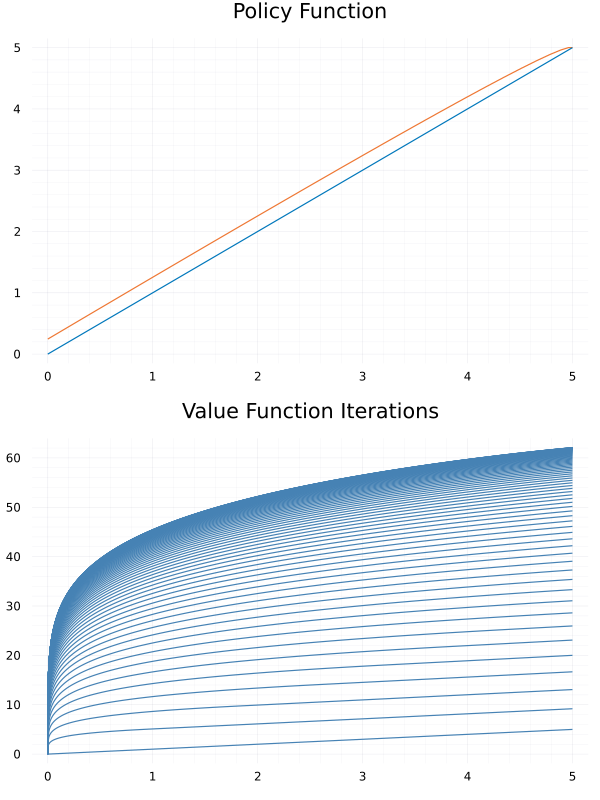

In [67]:
V₁, V₂, h₁, h₂, a_grid = Continuous_Bellman_Solver(θ, U, tol);
vv(x) = h₂(x)
theme(:vibrant)
p1 = plot(vv, a_grid, legend = false, title = "Policy Function")
p1 = plot!(a_grid, a_grid)
p2 = plot(a_grid, V₁, color = "steelblue", legend = false, title = "Value Function Iterations")
p3 = plot(a_grid, V₂, color = "steelblue", legend = false, title = "Value Function Iterations")
plot(p1, p2, layout = (2, 1), size = (600, 800), dpi = 1000)

In [64]:
function Discrete_Bellman_Solver(θ, U, tol)
    r, σ, ω, β, s, N = θ
    N = Int64(N)
    a_max = 5.
    a_min = 0.
    a_grid = collect(range(a_min, a_max, length = N))

    Γ(a, s) = min((1 + r)*a + ω*s, a_max)

    V₁ = [a_grid]
    V₂ = [a_grid] 
    dist = 1
    V1 = zeros(N)
    V2 = zeros(N)

    R₁ = zeros(N, N)
    R₂ = zeros(N, N)
    for i ∈ 1:N
        R₁[i, :] .= U.(a_grid[i], a_grid, s[1])
        R₂[i, :] .= U.(a_grid[i], a_grid, s[2])
    end
    P = 0.5 #Shocks are IID.
    Ω₁ = zeros(N, N)
    Ω₂ = zeros(N, N)
    while dist > tol
        Ω₁ = zeros(N, N)
        Ω₂ = zeros(N, N)
        for i ∈ 1:N
            max_a₁ = Γ(a_grid[i], s[1])
            max_a₂ = Γ(a_grid[i], s[2])
            a₁_index = a_grid .<= max_a₁
            a₂_index = a_grid .<= max_a₂
            Ω₁[i, a₁_index] .= R₁[i, a₁_index] .+ β .* P .* (V₁[end][a₁_index] .+ V₂[end][a₁_index])
            Ω₂[i, a₂_index] .= R₂[i, a₂_index] .+ β .* P .* (V₁[end][a₂_index] .+ V₂[end][a₂_index])
        end
        V1 = vec(maximum(Ω₁, dims = 2))
        V2 = vec(maximum(Ω₂, dims = 2))
        dist = maximum([maximum(abs.(V1 .- V₁[end])), maximum(abs.(V2 .- V₂[end]))])
        append!(V₁, [V1])
        append!(V₂, [V2])
    end
    a₁_prime = [a_grid[argmax(Ω₁[i, :])] for i ∈ 1:N]
    a₂_prime = [a_grid[argmax(Ω₂[i, :])] for i ∈ 1:N]

    return V₁, V₂, LinearInterpolation(a_grid, a₁_prime), LinearInterpolation(a_grid, a₂_prime), a_grid
end

Discrete_Bellman_Solver (generic function with 1 method)

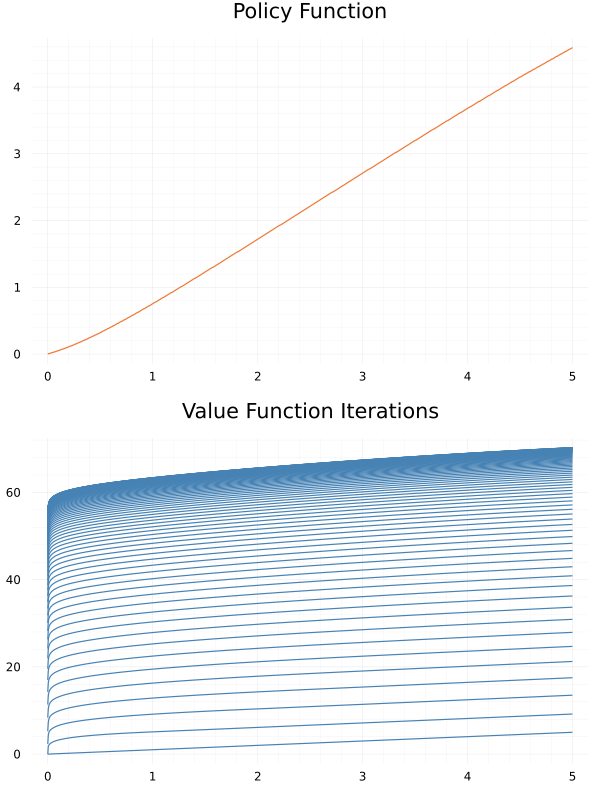

In [65]:
V₁, V₂, h₁, h₂, a_grid = Discrete_Bellman_Solver(θ, U, tol);
vv(x) = h₁(x)
theme(:vibrant)
p1 = plot(vv, a_grid, legend = false, title = "Policy Function")
#p1 = plot!(a_grid, a_grid)
p2 = plot(a_grid, V₁, color = "steelblue", legend = false, title = "Value Function Iterations")
p3 = plot(a_grid, V₂, color = "steelblue", legend = false, title = "Value Function Iterations")
plot(p1, p2, layout = (2, 1), size = (600, 800), dpi = 1000)

## 4.2 Compairing with Continuous Bellman Solver

In [69]:
N = 100
θ = [r, σ, ω, β, s, N];
println("The Continuous Bellman Solver Runtime with N=100:")
@btime Continuous_Bellman_Solver(θ, U, tol);

The Continuous Bellman Solver Runtime with N=100:
  501.942 ms (19726274 allocations: 319.31 MiB)


In [70]:
println("The Discrete Bellman Solver Runtime with N=100:")
@btime Discrete_Bellman_Solver(θ, U, tol);

The Discrete Bellman Solver Runtime with N=100:
  64.142 ms (605650 allocations: 67.46 MiB)


#### The Runtime for Continuous Function, with N=100, is about 1260ms, and for Discrete Function is about 97ms. This show that the Discrete Function is about 13 times faster than Continuous Function.

## 4.3 Using the Discrete version for the initial guess of the Continuous version.

In [71]:
function mix_Bellman_Solver(θ, U, tol)
    V₁, V₂, h₁, h₂, a_grid = Discrete_Bellman_Solver(θ, U, tol)
    V₁, V₂, h₁, h₂, a_grid = Continuous_Bellman_Solver(θ, U, tol, IG₁ = V₁[end], IG₂ = V₂[end])
    return V₁, V₂, h₁, h₂, a_grid
end

mix_Bellman_Solver (generic function with 1 method)

In [73]:
println("The Mix Bellman Solver Runtime with N=100:")
@btime mix_Bellman_Solver(θ, U, tol);

The Mix Bellman Solver Runtime with N=100:
  546.097 ms (19526994 allocations: 373.73 MiB)


In [76]:
V₁, V₂, h₁, h₂, a_grid = mix_Bellman_Solver(θ, U, tol);

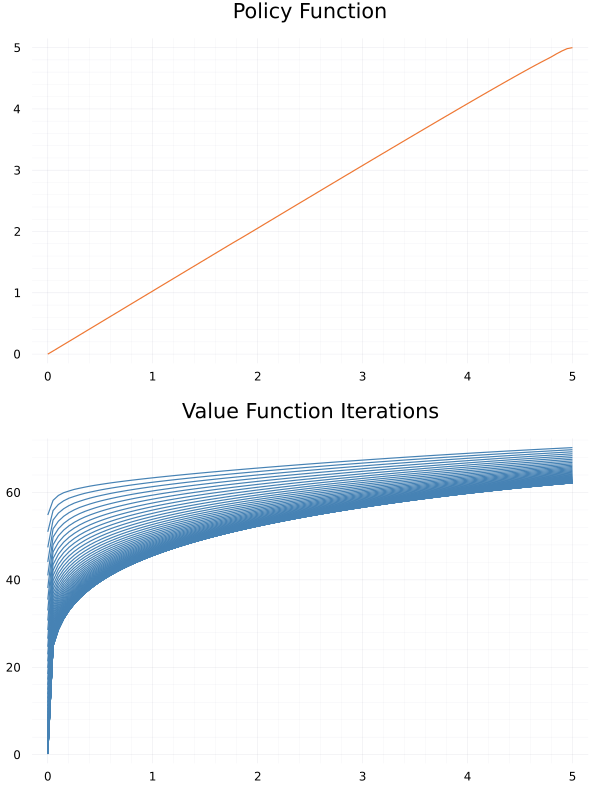

In [77]:
vv(x) = h₁(x)
theme(:vibrant)
p1 = plot(vv, a_grid, legend = false, title = "Policy Function")
p2 = plot(a_grid, V₁, color = "steelblue", legend = false, title = "Value Function Iterations")
p3 = plot(a_grid, V₂, color = "steelblue", legend = false, title = "Value Function Iterations")
plot(p1, p2, layout = (2, 1), size = (600, 800), dpi = 1000)